In [ ]:
!pip install scikit-learn
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Number of instances in training set: 1248
Number of instances in validation set: 832
Accuracy: 49.16%
              precision    recall  f1-score   support

           0       0.49      1.00      0.66       409
           1       0.00      0.00      0.00       423

    accuracy                           0.49       832
   macro avg       0.25      0.50      0.33       832
weighted avg       0.24      0.49      0.32       832



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


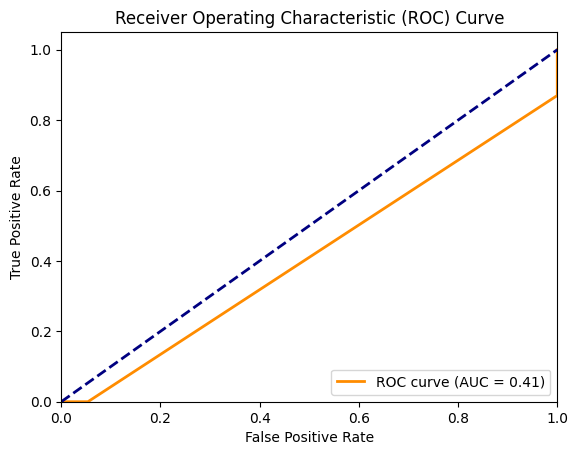

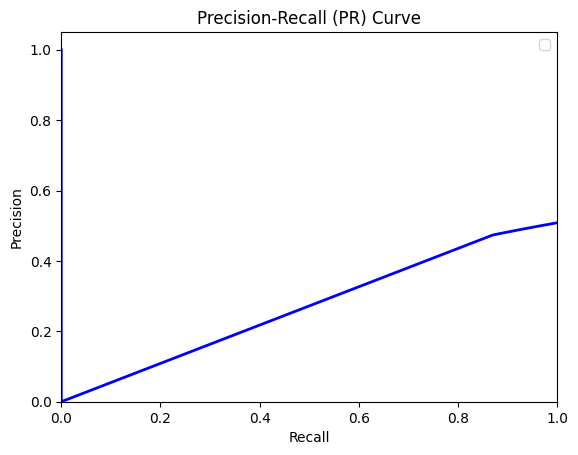

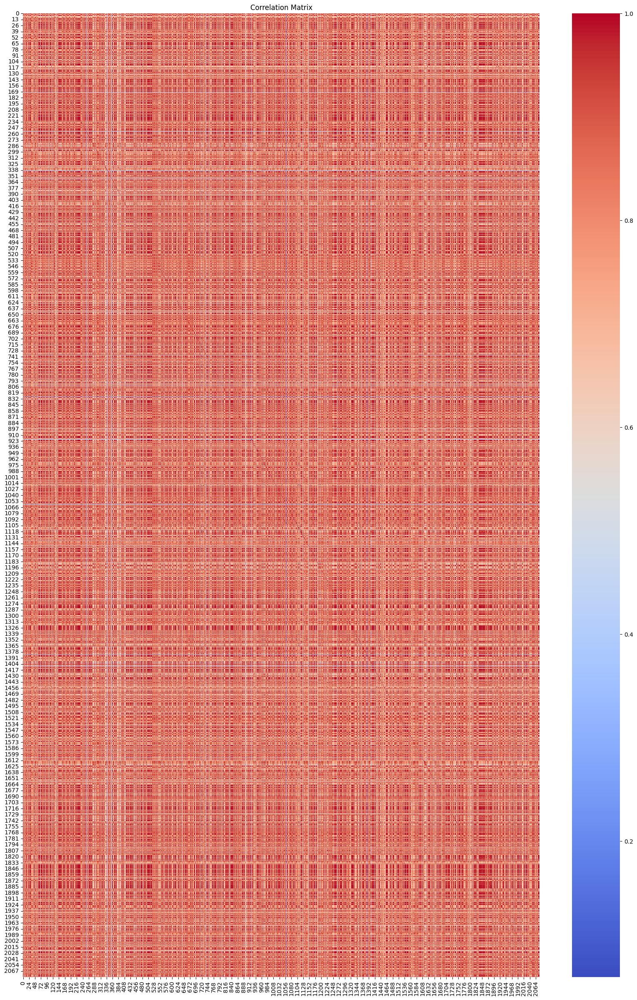

Confusion Matrix:
[[409   0]
 [423   0]]


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score, confusion_matrix
import seaborn as sns

# Load the dataset from a CSV file (replace 'your_data.csv' with the name of your CSV file)
data = pd.read_csv('/content/drive/MyDrive/major_project/LSTM_data/data.csv')

# Separate the features (X) and the target variable (y)
X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)


# Print the number of instances in the training and validation sets
print("Number of instances in training set: {}".format(len(X_train)))
print("Number of instances in validation set: {}".format(len(X_test)))


# Preprocess the data by standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create the SVM classifier with a linear kernel
svm_classifier = SVC(kernel='rbf', C=5.1,gamma=0.501, probability=True)

# Train the classifier
svm_classifier.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_classifier.predict(X_test_scaled)


# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Print the classification report
report = classification_report(y_test, y_pred)
print(report)

# Calculate the probabilities for the ROC curve and PR curve
y_probs = svm_classifier.predict_proba(X_test_scaled)[:, 1]

# Calculate the ROC curve and the AUC score
fpr, tpr, _ = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

# Calculate the PR curve and average precision
precision, recall, _ = precision_recall_curve(y_test, y_probs)
average_precision = average_precision_score(y_test, y_probs)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


# Plot the PR curve
plt.figure()
plt.plot(recall, precision, color='blue', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall (PR) Curve')
plt.legend(loc="upper right")
plt.show()



# Print the correlation matrix
plt.figure(figsize=(20,30))
corr_matrix = np.corrcoef(X_test, X_train)
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()


# Print the confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(confusion_mat)




In [ ]:
plt.savefig("fig.jpg")

NameError: ignored

Epoch 1/50
39/39 [==============================] - 3s 27ms/step - loss: 7.6270 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 2/50
39/39 [==============================] - 0s 8ms/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 3/50
39/39 [==============================] - 0s 7ms/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 4/50
39/39 [==============================] - 0s 6ms/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 5/50
39/39 [==============================] - 0s 6ms/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 6/50
39/39 [==============================] - 0s 7ms/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 7/50
39/39 [==============================] - 0s 7ms/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 8/50
39/39 [=

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


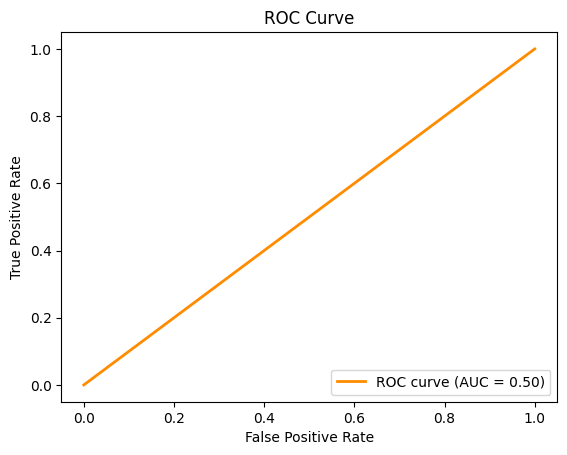

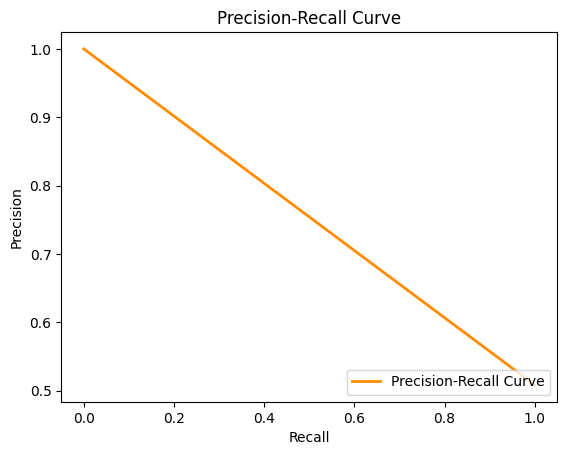

Confusion Matrix:
 [[409   0]
 [423   0]]


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_curve, auc, precision_recall_curve
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix, precision_recall_curve
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv('/content/drive/MyDrive/major_project/LSTM_data/EFS_filtr_feature.csv')

# Split into features and target
X = df.drop('Class', axis=1)
y = df['Class']

# reshape input to be [samples, time steps, features]
X = np.reshape(X.values, (X.shape[0], 1, X.shape[1]))

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Define LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1, activation='relu'))


# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print('Accuracy: {:.2f}%'.format(accuracy*100))

# Make predictions on the test set and compute the classification report
y_pred_proba = model.predict(X_test)
y_pred = (y_pred_proba > 0.5).astype(int)
report = classification_report(y_test, y_pred)
print(report)

# Compute the AUC and plot the ROC curve
roc_auc = roc_auc_score(y_test, y_pred_proba)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Compute and plot the precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recall, precision, color='darkorange', lw=2, label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower right")
plt.show()

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Load the CSV file
df = pd.read_csv('/content/drive/MyDrive/major_project/LSTM_data/lstm_input.csv')

# Assume 'sentences' column contains the sequences and 'labels' column contains the target
X = df['Sequence']
y = df['Class']

# Define the sequence length (you may want to choose a different value)
sequence_length = 1000

# Tokenize the sentences
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)
X = tokenizer.texts_to_sequences(X)

# Pad the sequences
X = pad_sequences(X, maxlen=sequence_length)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the LSTM model
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index)+1, output_dim=128, input_length=sequence_length))
model.add(LSTM(128))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10)

# Predict the test set results
y_pred = model.evaluate(X_test)

# Print the classification report
print(classification_report(y_test, y_pred))


Epoch 1/10
52/52 [==============================] - 119s 2s/step - loss: 0.6947 - accuracy: 0.4946 - val_loss: 0.6941 - val_accuracy: 0.4880
Epoch 2/10
52/52 [==============================] - 114s 2s/step - loss: 0.6812 - accuracy: 0.6382 - val_loss: 0.6935 - val_accuracy: 0.5048
Epoch 3/10
52/52 [==============================] - 116s 2s/step - loss: 0.4916 - accuracy: 0.8846 - val_loss: 0.7135 - val_accuracy: 0.5096
Epoch 4/10
52/52 [==============================] - 114s 2s/step - loss: 0.0357 - accuracy: 1.0000 - val_loss: 0.7523 - val_accuracy: 0.5048
Epoch 5/10
52/52 [==============================] - 129s 2s/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 0.7632 - val_accuracy: 0.5000
Epoch 6/10
52/52 [==============================] - 114s 2s/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.7738 - val_accuracy: 0.5024
Epoch 7/10
52/52 [==============================] - 124s 2s/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.7764 - val_accuracy: 0.5024
Epoch 8/10
52

ValueError: ignored

In [ ]:
print(X_train)

[[   0    0    0 ...    0    0 2039]
 [   0    0    0 ...    0    0  679]
 [   0    0    0 ...    0    0 1502]
 ...
 [   0    0    0 ...    0    0 1131]
 [   0    0    0 ...    0    0 1295]
 [   0    0    0 ...    0    0  861]]


https://www.geeksforgeeks.org/sentiment-analysis-with-an-recurrent-neural-networks-rnn/

https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM

In [ ]:
from tensorflow.keras.layers import SimpleRNN, LSTM, GRU, Bidirectional, Dense, Embedding
from tensorflow.keras.models import Sequential
import numpy as np
from tensorflow.keras.preprocessing import sequence


sequence_length = 424
# Assume 'sentences' column contains the sequences and 'labels' column contains the target
X = df['Sequence']
y = df['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

print(type(X_train[0]))
x_train = sequence.pad_sequences(X_train, maxlen=sequence_length)
x_test = sequence.pad_sequences(X_test, maxlen=sequence_length)

x_valid, y_valid = x_train[:64], y_train[:64]
x_train_, y_train_ = x_train[64:], y_train[64:]

<class 'str'>


ValueError: ignored

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/major_project/LSTM_data/lstm_input.csv')

# Assume 'Sequences' column contains the sequences and 'Labels' column contains the target
sequences = df['Sequence'].tolist()
labels = df['Class'].tolist()

# Define the sequence length 
sequence_length = 200

# Tokenize the sequences
tokenizer = Tokenizer(char_level=True)
tokenizer.fit_on_texts(sequences)
sequences = tokenizer.texts_to_sequences(sequences)

# Pad the sequences
sequences = pad_sequences(sequences, maxlen=sequence_length)

# One-hot encode the labels
labels = to_categorical(labels)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(sequences, labels, test_size=0.2, random_state=42)

# Define the LSTM model
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index)+1, output_dim=128, input_length=sequence_length))
model.add(LSTM(128))
model.add(Dropout(0.2))
model.add(Dense(labels.shape[1], activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=1)

# Predict the test set results
y_pred = model.predict_on_batch(X_test)

# Print the classification report
print(classification_report(np.argmax(y_test, axis=1), y_pred))


52/52 [==============================] - 27s 462ms/step - loss: 0.1228 - accuracy: 0.9946 - val_loss: 0.0052 - val_accuracy: 0.9976


ValueError: ignored

LSTM Model


17464789/17464789 [==============================] - 1s 0us/step
Epoch 1/5
391/391 [==============================] - 133s 333ms/step - loss: 0.4353 - accuracy: 0.7919 - val_loss: 0.3581 - val_accuracy: 0.8460
Epoch 2/5
391/391 [==============================] - 121s 310ms/step - loss: 0.3034 - accuracy: 0.8735 - val_loss: 0.3497 - val_accuracy: 0.8464
Epoch 3/5
391/391 [==============================] - 118s 303ms/step - loss: 0.2638 - accuracy: 0.8930 - val_loss: 0.3569 - val_accuracy: 0.8430
Epoch 4/5
391/391 [==============================] - 118s 303ms/step - loss: 0.2235 - accuracy: 0.9126 - val_loss: 0.3924 - val_accuracy: 0.8440
Epoch 5/5
782/782 [==============================] - 39s 50ms/step
              precision    recall  f1-score   support

           0       0.88      0.78      0.83     12500
           1       0.80      0.89      0.85     12500

    accuracy                           0.84     25000
   macro avg       0.84      0.84      0.84     25000
weighted avg    

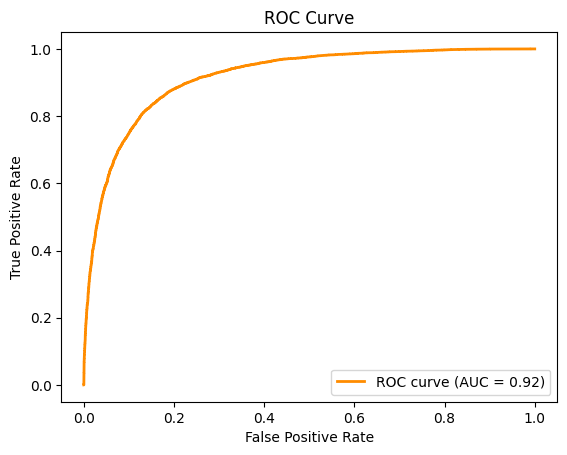

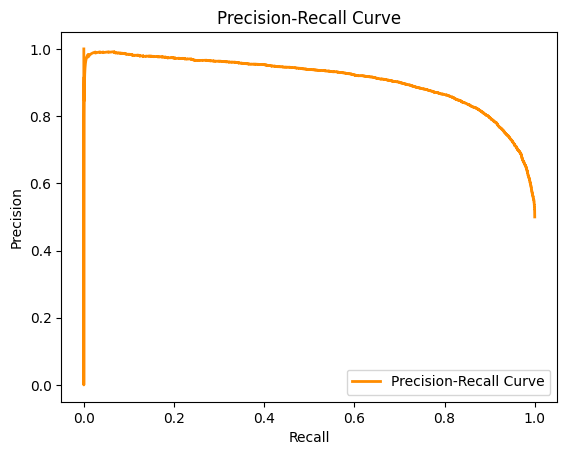

Confusion Matrix:
 [[ 9777  2723]
 [ 1352 11148]]


In [ ]:
import numpy as np
from tensorflow.keras.datasets import imdb
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix, precision_recall_curve
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import classification_report

# Parameters:
vocab_size = 5000
maxlen = 100
embedding_size = 32
batch_size = 64
epochs = 5

# Load dataset
(X_train, y_train), (X_test, y_test) = imdb.load_data(num_words=vocab_size)
X_train = pad_sequences(X_train, maxlen=maxlen)
X_test = pad_sequences(X_test, maxlen=maxlen)

# Define LSTM Model
model = Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=maxlen))
model.add(LSTM(128))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(X_test, y_test))

# Evaluate the model
#y_pred = (model.predict(X_test) > 0.5).astype("int32")

# Make predictions on the test set and compute the classification report
y_pred_proba = model.predict(X_test)
y_pred = (y_pred_proba > 0.5).astype(int)
report = classification_report(y_test, y_pred)
print(report)


# Compute the AUC and plot the ROC curve
roc_auc = roc_auc_score(y_test, y_pred_proba)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()



# Compute and plot the precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recall, precision, color='darkorange', lw=2, label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower right")
plt.show()

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

In [ ]:
plt.savefig('fig.png')

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Parameters
vocab_size = 500
maxlen = 400
embedding_size = 32
batch_size = 64
epochs = 5

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/major_project/LSTM_data/lstm_input.csv')

# Prepare the tokenizer on the training data
tokenizer = Tokenizer(num_words=vocab_size)
tokenizer.fit_on_texts(df['Sequence'])

# Convert the text data into integer sequences
X = tokenizer.texts_to_sequences(df['Sequence'])
y = df['Class'].values

# Pad sequences
X = pad_sequences(X, maxlen=maxlen)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Define LSTM Model
model = Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=maxlen))
model.add(LSTM(128))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, batch_size=batch_size, epochs=50, verbose=1, validation_data=(X_test, y_test))

# Evaluate the model
y_pred = (model.predict(X_test) > 0.5).astype("int32")

# Print the classification report
print(classification_report(y_test, y_pred))


Epoch 1/50
20/20 [==============================] - 26s 1s/step - loss: 0.6934 - accuracy: 0.5128 - val_loss: 0.6908 - val_accuracy: 0.4916
Epoch 2/50
20/20 [==============================] - 23s 1s/step - loss: 0.6880 - accuracy: 0.5056 - val_loss: 0.6852 - val_accuracy: 0.4916
Epoch 3/50
20/20 [==============================] - 23s 1s/step - loss: 0.6749 - accuracy: 0.6210 - val_loss: 0.6550 - val_accuracy: 0.5084
Epoch 4/50
20/20 [==============================] - 21s 1s/step - loss: 0.6150 - accuracy: 0.6891 - val_loss: 0.5880 - val_accuracy: 0.7440
Epoch 5/50
20/20 [==============================] - 22s 1s/step - loss: 0.5506 - accuracy: 0.7372 - val_loss: 0.5343 - val_accuracy: 0.7440
Epoch 6/50
20/20 [==============================] - 22s 1s/step - loss: 0.5284 - accuracy: 0.7372 - val_loss: 0.5052 - val_accuracy: 0.7440
Epoch 7/50
20/20 [==============================] - 27s 1s/step - loss: 0.5059 - accuracy: 0.7372 - val_loss: 0.4936 - val_accuracy: 0.7440
Epoch 8/50
20/20 [==

In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Parameters
vocab_size = 500
maxlen = 400
embedding_size = 32
batch_size = 64
epochs = 5

# Load your own dataset
df = pd.read_csv('/content/drive/MyDrive/major_project/LSTM_data/lstm_input.csv')

# Prepare the tokenizer on the training data
tokenizer = Tokenizer(num_words=vocab_size)
tokenizer.fit_on_texts(df['Sequence'])

# Convert the text data into integer sequences
X = tokenizer.texts_to_sequences(df['Sequence'])
y = df['Class'].values

# Pad sequences
X = pad_sequences(X, maxlen=maxlen)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Define LSTM Model
model = Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=maxlen))
model.add(LSTM(128))
model.add(Dense(1, activation='tanh'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, batch_size=batch_size, epochs=50, verbose=1, validation_data=(X_test, y_test))

# Evaluate the model
y_pred = (model.predict(X_test) > 0.5).astype("int32")

# Print the classification report
print(classification_report(y_test, y_pred))


Epoch 1/50
20/20 [==============================] - 25s 1s/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 2/50
20/20 [==============================] - 20s 1s/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 3/50
20/20 [==============================] - 24s 1s/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 4/50
20/20 [==============================] - 20s 1s/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 5/50
20/20 [==============================] - 28s 1s/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 6/50
20/20 [==============================] - 22s 1s/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 7/50
20/20 [==============================] - 22s 1s/step - loss: 7.6260 - accuracy: 0.5056 - val_loss: 7.8423 - val_accuracy: 0.4916
Epoch 8/50
20/20 [==

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
